# REVISAR!!!!!
## Tempo está em segundos ou milissegundos??
A matriz `A` resultante parece discretizada com `10,algumacoisa` na linha 1, coluna 2, MAS o tempo utilizado na simulação está em segundos!!

In [4]:
import numpy as np
# Importando a biblioteca necessária para plotagem
import matplotlib
#matplotlib.use('Agg')
import matplotlib.pyplot as plt
import pandas as pd

#plt.rc('font', size=30)
plt.rcdefaults()

counts_per_turn = 2000
gear_ratio = 3.5
degrees_per_turn = 360



def pulse2angle(pulses:pd.Series, counts_per_turn, gear_ratio, degrees_per_turn):
    return ((pulses/counts_per_turn)/gear_ratio)*degrees_per_turn

# Regime Transiente

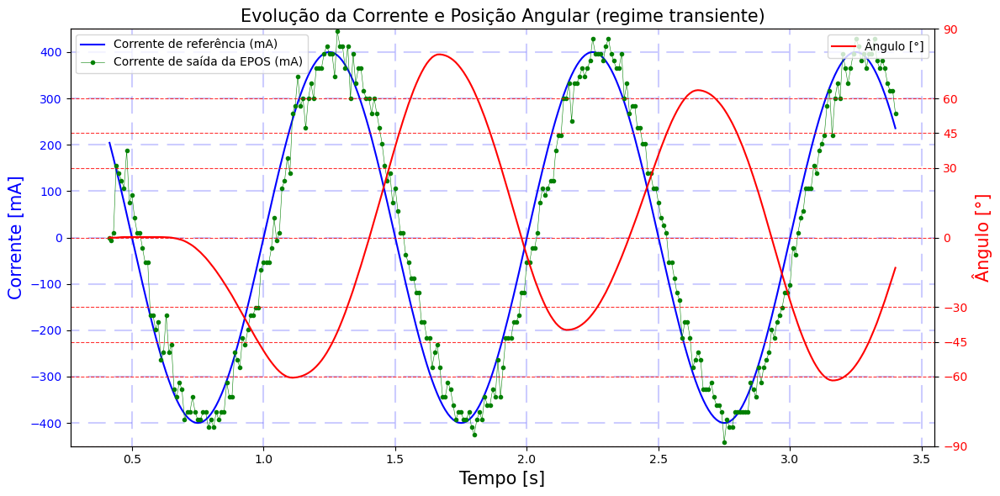

In [5]:
data=pd.read_csv("KEEPIT-log_2023_09_06-13_17_50-openloop.csv", nrows=300)
fontsize=15

data['time_s']=data['time_us']/1e6
data['angle_o']=pulse2angle(data['pulse_qc'],counts_per_turn,gear_ratio,degrees_per_turn)

# Criando um gráfico com dois eixos y
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotando setpoint_current_mA e actual_current_mA no eixo y esquerdo
ax1.plot(data['time_s'].to_numpy(), data['setpoint_current_mA'].to_numpy(), label='Corrente de referência (mA)', color='blue')
ax1.plot(data['time_s'].to_numpy(), data['actual_current_mA'].to_numpy(), '-o', markersize=3, label='Corrente de saída da EPOS (mA)', color='green', linewidth=.4)

# Definindo rótulos e título
ax1.set_xlabel('Tempo [s]', fontsize=fontsize)
ax1.set_title('Evolução da Corrente e Posição Angular (regime transiente)', fontsize=fontsize)
ax1.tick_params(axis='y', labelcolor='blue')
ax1.grid(True, color='blue', linestyle=(5,(10,5)), alpha=.2, linewidth=1.5)
ax1.set_ylim([-450,450])
ax1.set_ylabel('Corrente [mA]', color='blue', fontsize=fontsize)


# Criando um segundo eixo y para angle_o
ax2 = ax1.twinx()
ax2.plot(data['time_s'].to_numpy(), data['angle_o'].to_numpy(), label='Ângulo [°]', color='red')
ax2.set_ylabel('Ângulo [°]', color='red', fontsize=fontsize)
ax2.set_yticks([-90, -60, -45, -30, 0, 30, 45, 60, 90])
ax2.tick_params(axis='y', labelcolor='red')
ax2.grid(True, color='red', linestyle='dashed', alpha=.8)

# Adicionando legendas
ax1.legend(loc='upper left', prop={'size':10}, fontsize=fontsize)
ax2.legend(loc='upper right', prop={'size':10}, fontsize=fontsize)

# Mostrando o gráfico
plt.grid(True, which='both', axis='both')
plt.tight_layout()
#plt.subplots_adjust(left=0.3, right=0.9, bottom=0.3, top=0.9)
#plt.savefig('/tmp/evolucao-angulo-corrente-transiente.png')
plt.draw()

# Regime Permanente

---- actual_current_mA no window----
max(yf)=398.1140687949436, at index 19
frequency @ max(yf)=1.0Hz

---- actual_current_mA yes window----
max(ywf)=166.84958565074197, at index 19
frequency @ max(ywf)=1.0Hz

---- angle_o no window----
max(yf)=62.36453901971723, at index 19
frequency @ max(yf)=1.0Hz

---- angle_o yes window----
max(ywf)=26.79025574641812, at index 19
frequency @ max(ywf)=1.0Hz



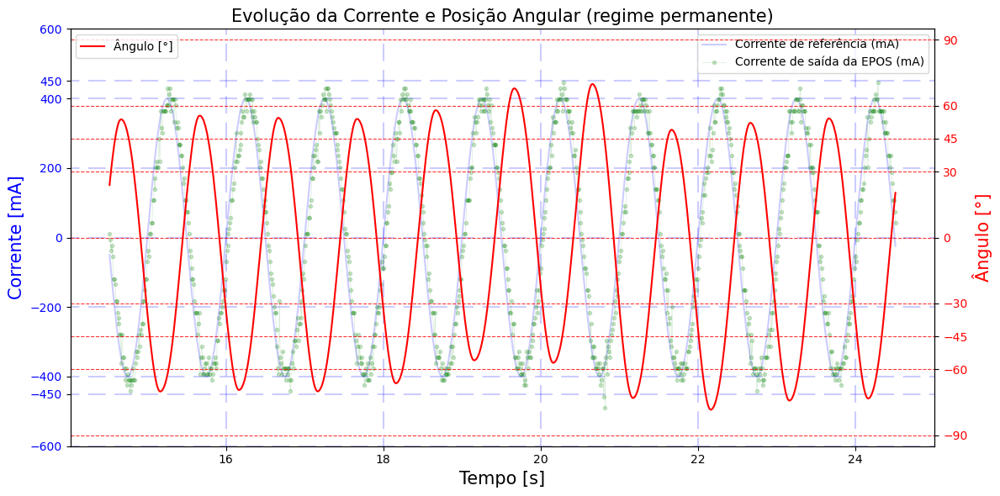

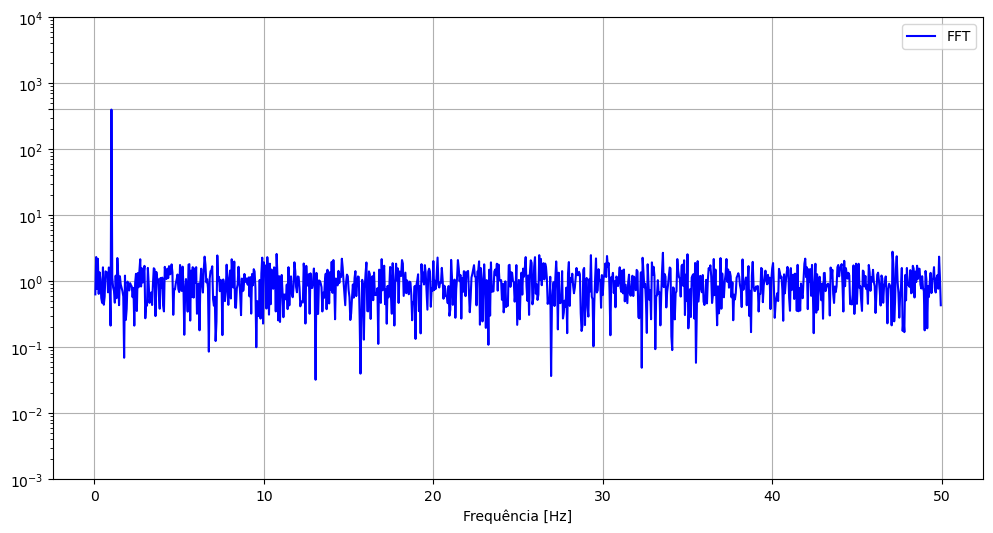

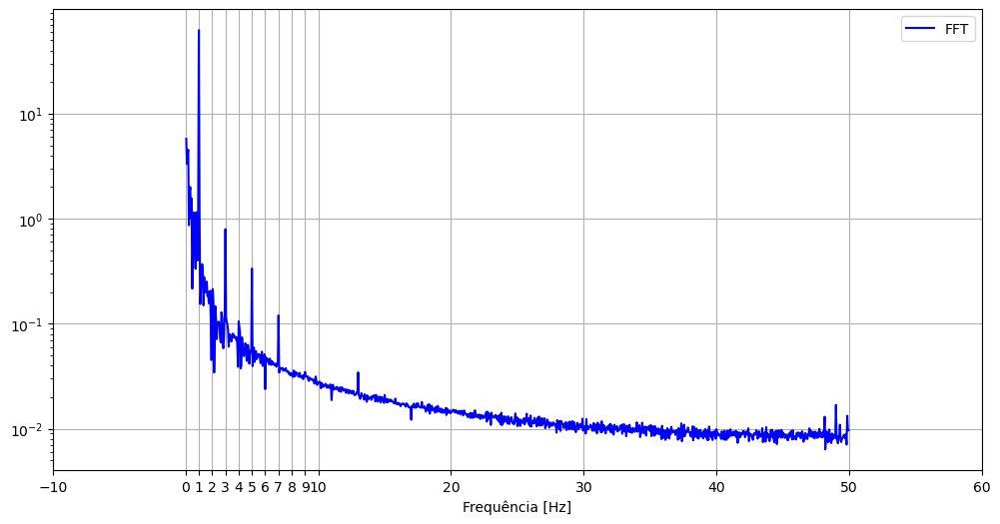

In [6]:
data=pd.read_csv("KEEPIT-log_2023_09_06-13_17_50-openloop.csv", skiprows=range(1,1412), nrows=2000)
fontsize=15 

data['time_s']=data['time_us']/1e6
data['angle_o']=pulse2angle(data['pulse_qc'],counts_per_turn,gear_ratio,degrees_per_turn)

# Criando um gráfico com dois eixos y
fig, ax3 = plt.subplots(figsize=(12, 6))

# Plotando setpoint_current_mA e actual_current_mA no eixo y esquerdo
ax3.plot(data['time_s'][0:1000].to_numpy(), data['setpoint_current_mA'][0:1000].to_numpy(), alpha=.2, label='Corrente de referência (mA)', color='blue')
ax3.plot(data['time_s'][0:1000].to_numpy(), data['actual_current_mA'][0:1000].to_numpy(), '-o', alpha=.2, markersize=3, label='Corrente de saída da EPOS (mA)', color='green', linewidth=.4)

# Definindo rótulos e título
ax3.set_xlabel('Tempo [s]', fontsize=fontsize)
ax3.set_title('Evolução da Corrente e Posição Angular (regime permanente)', fontsize=fontsize)
ax3.tick_params(axis='y', labelcolor='blue')
ax3.grid(True, color='blue', linestyle=(5,(10,5)), alpha=.2, linewidth=1.5)
ax3.set_ylim([-500,500])
ax3.set_yticks(np.concatenate((ax3.get_yticks(),[-450, 450])))
ax3.set_ylabel('Corrente [mA]', color='blue', fontsize=fontsize)


# Criando um segundo eixo y para angle_o
ax4 = ax3.twinx()
ax4.plot(data['time_s'][0:1000].to_numpy(), data['angle_o'][0:1000].to_numpy(), label='Ângulo [°]', color='red')
ax4.set_ylabel('Ângulo [°]', color='red', fontsize=fontsize)
ax4.set_yticks([-90, -60, -45, -30, 0, 30, 45, 60, 90])
ax4.set_ylim([-95,95])
ax4.tick_params(axis='y', labelcolor='red')
ax4.grid(True, color='red', linestyle='dashed', alpha=.8)

# Adicionando legendas
ax3.legend(loc='upper right', prop={'size':10}, fontsize=fontsize)
ax4.legend(loc='upper left', prop={'size':10}, fontsize=fontsize)

# Mostrando o gráfico
plt.grid(True, which='both', axis='both')
plt.tight_layout()
#plt.subplots_adjust(left=0.3, right=0.9, bottom=0.3, top=0.9)
#plt.savefig('/tmp/evolucao-angulo-corrente-transiente.png')
plt.draw()

#------------------

import scipy

def get_fft(signal_time:pd.Series, signal:pd.Series, sampling_period:float, plot:bool=True, **kwargs):

    N=signal.size
    T=.01
    x=signal_time.to_numpy()
    y=signal.to_numpy()
    yf = scipy.fft.fft(y)
    w=scipy.signal.windows.blackman(N)
    ywf=scipy.fft.fft(y*w)
    xf=scipy.fft.fftfreq(N,T)[:N//2]
    xf_graph = xf[1:N//2]
    yf_graph = 2.0/N * np.abs(yf[1:N//2])
    ywf_graph = 2.0/N * np.abs(ywf[1:N//2])
    if plot:
        fig, ax = plt.subplots(figsize=(12, 6))
        ax.semilogy(xf_graph, yf_graph, '-b')
        #ax.semilogy(xf_graph, ywf_graph, '-r')
        ax.legend(['FFT', 'FFT w. window'])
        ax.set_xlabel('Frequência [Hz]')
        
        if 'xticks' in kwargs.keys():
            ax.set_xticks(np.concatenate((ax.get_xticks(),kwargs['xticks'])))
        if 'yticks' in kwargs.keys():
            ax.set_yticks(np.concatenate((ax.get_yticks(),kwargs['yticks'])))
        ax.grid()
        plt.draw()

    return xf_graph, yf_graph, ywf_graph

xf,yf,ywf=get_fft(data['time_s'], data['actual_current_mA'], 0.1, yticks=[400])

max_yf=np.max(np.abs(yf))
idx_max_yf=np.argmax(yf)

max_ywf=np.max(np.abs(ywf))
idx_max_ywf=np.argmax(ywf)

print('---- actual_current_mA no window----')
print(f'max(yf)={max_yf}, at index {idx_max_yf}')
print(f'frequency @ max(yf)={np.round(xf[idx_max_yf],3)}Hz')
print()
print('---- actual_current_mA yes window----')
print(f'max(ywf)={max_ywf}, at index {idx_max_ywf}')
print(f'frequency @ max(ywf)={np.round(xf[idx_max_ywf],3)}Hz')
print()


xf,yf,ywf=get_fft(data['time_s'], data['angle_o'], 0.1, xticks=np.arange(1,10,1))

max_yf=np.max(np.abs(yf))
idx_max_yf=np.argmax(yf)

max_ywf=np.max(np.abs(ywf))
idx_max_ywf=np.argmax(ywf)

print('---- angle_o no window----')
print(f'max(yf)={max_yf}, at index {idx_max_yf}')
print(f'frequency @ max(yf)={np.round(xf[idx_max_yf],3)}Hz')
print()
print('---- angle_o yes window----')
print(f'max(ywf)={max_ywf}, at index {idx_max_ywf}')
print(f'frequency @ max(ywf)={np.round(xf[idx_max_ywf],3)}Hz')
print()

# Ruído total

       time_us  current_noise_mA
0       414669               NaN
1       419755               NaN
2       429713               NaN
3       439753        -49.332000
4       449715        -54.241000
...        ...               ...
4210  42509712         -8.743700
4211  42519753        -15.828100
4212  42529713         -6.610266
4213  42539753        -13.603300
4214  42549713         -4.479700

[4215 rows x 2 columns]
---- angle_o no window----
max(yf)=2.3243598082293366, at index 1762
frequency @ max(yf)=41.926Hz

---- angle_o yes window----
max(ywf)=1.1515394083006234, at index 1762
frequency @ max(ywf)=41.926Hz



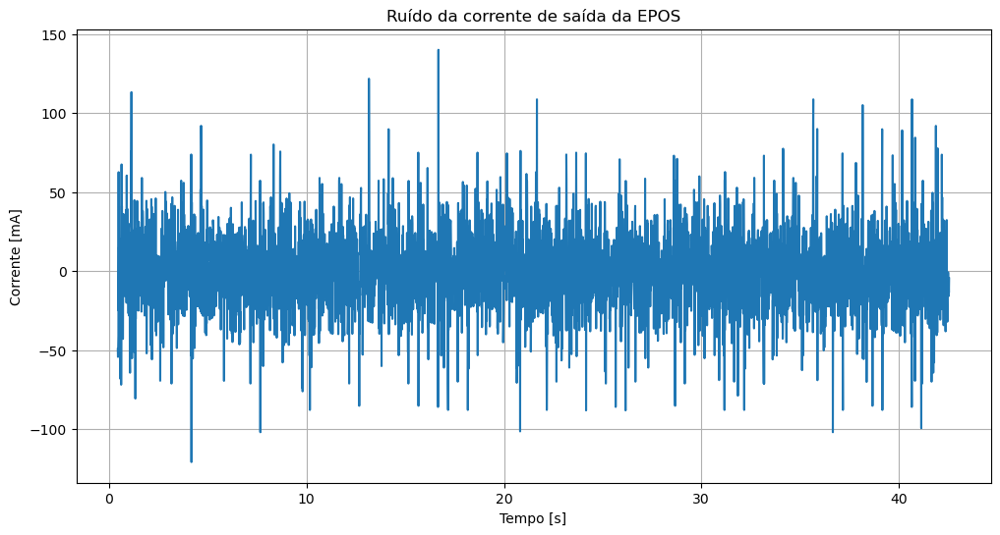

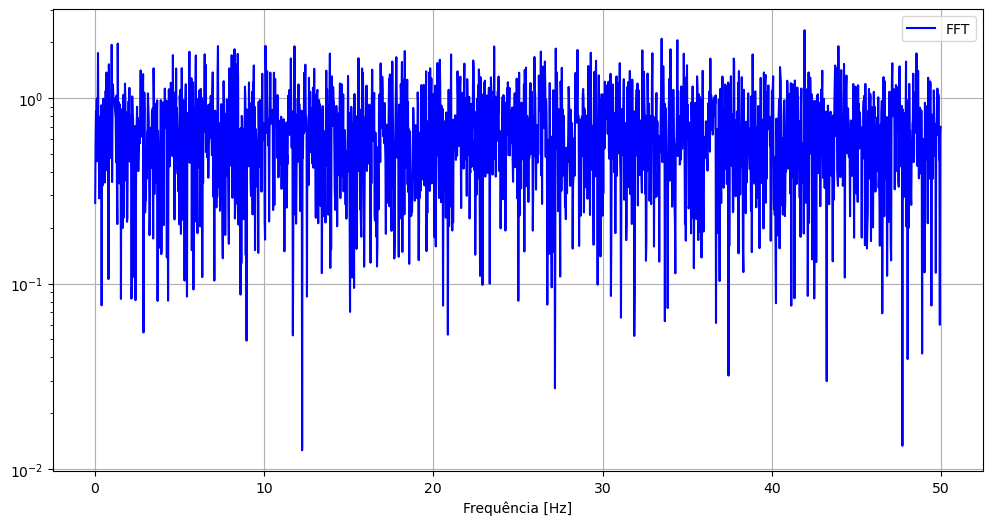

In [7]:
data=pd.read_csv("KEEPIT-log_2023_09_06-13_17_50-openloop.csv")

fig, ax5 = plt.subplots(figsize=(12, 6))

current_noise = pd.DataFrame()
current_noise['time_us'] = data['time_us']
# devido ao funcionamento do PDO do CANOpen, a corrente de saída é defasada de 3 ciclose de comunicação do PDO. Como o ciclo é de 10 ms, logo são 30 ms.
current_noise['current_noise_mA'] = data['actual_current_mA']-data['setpoint_current_mA'].shift(periods=3)
current_noise.to_csv('current_noise_2023_09_06-13_17_50.csv')
print(current_noise)

ax5.plot(current_noise['time_us'].to_numpy()/1e6, current_noise['current_noise_mA'].to_numpy(), label='Corrente de referência (mA)')
ax5.set_title('Ruído da corrente de saída da EPOS')
ax5.set_ylabel('Corrente [mA]')
ax5.set_xlabel('Tempo [s]')
ax5.grid(True)
plt.draw()

xf,yf,ywf=get_fft(current_noise['time_us'][10:], current_noise['current_noise_mA'][10:], 0.1, "FFT ")

max_yf=np.max(np.abs(yf))
idx_max_yf=np.argmax(yf)

max_ywf=np.max(np.abs(ywf))
idx_max_ywf=np.argmax(ywf)

print('---- angle_o no window----')
print(f'max(yf)={max_yf}, at index {idx_max_yf}')
print(f'frequency @ max(yf)={np.round(xf[idx_max_yf],3)}Hz')
print()
print('---- angle_o yes window----')
print(f'max(ywf)={max_ywf}, at index {idx_max_ywf}')
print(f'frequency @ max(ywf)={np.round(xf[idx_max_ywf],3)}Hz')
print()

#  Ruído tempo

9.998823920265782
0.16874864646322948
mínimo período de amostragem: 5.086000000000013
porcentagem dos períodos de amostragem p tal que 9.9 <= p < 10.1: 96.84% (4081.0/4214.0)


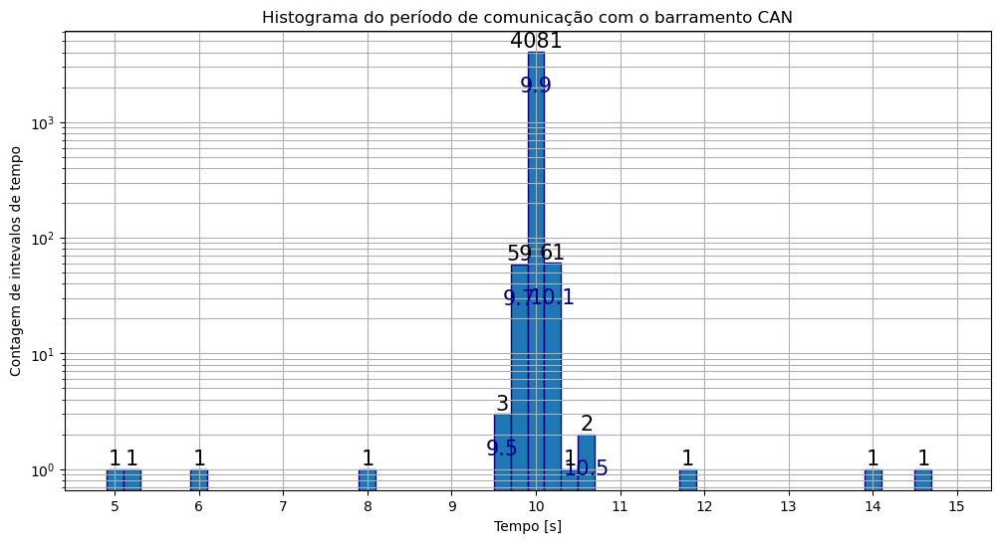

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

data=pd.read_csv("KEEPIT-log_2023_09_06-13_17_50-openloop.csv")

fig, ax6 = plt.subplots(figsize=(12, 6))

delta_time_s=np.diff(data['time_us']/1e3)
counts, edges, bars = ax6.hist(delta_time_s, edgecolor='darkblue', bins=(np.arange(4.9,15,.2)))
print(np.average(np.diff(data['time_us']/1e3)))
print(np.std(np.diff(data['time_us']/1e3)))
ax6.bar_label(bars, labels=[np.round(b.xy[0],3) for b in bars], label_type='center', fontsize=15, color='darkblue')
ax6.bar_label(bars, fontsize=15)
ax6.set_title('Histograma do período de comunicação com o barramento CAN')
ax6.set_ylabel('Contagem de intevalos de tempo')
ax6.set_xlabel('Tempo [s]')
ax6.set_yscale('log')
ax6.grid(True, which='both')
ax6.set_xticks(range(5,16))
plt.draw()
print(f"mínimo período de amostragem: {np.min(delta_time_s)}")
#print(f"máximo período de amostragem: {np.max(delta_time_s)}")
print(f"porcentagem dos períodos de amostragem p tal que 9.9 <= p < 10.1: {np.round(counts[np.where(np.isclose(edges,9.9))][0]*100/np.sum(counts),2)}% ({counts[np.where(np.isclose(edges,9.9))][0]}/{np.sum(counts)})")

A Good:  [[ 9.98480717e-01  1.09476313e+01]
 [-1.36958294e-04  9.82751526e-01]]
B Good:  [[0.00652817]
 [0.00058248]]


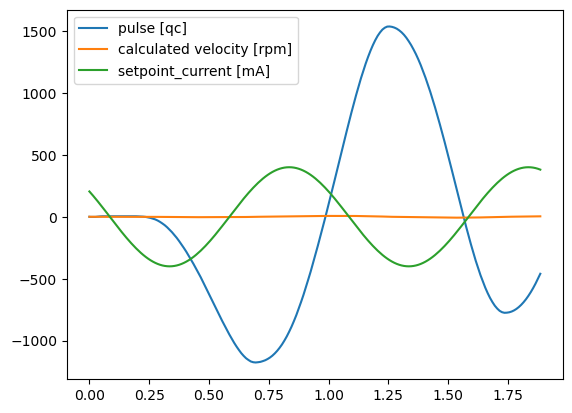

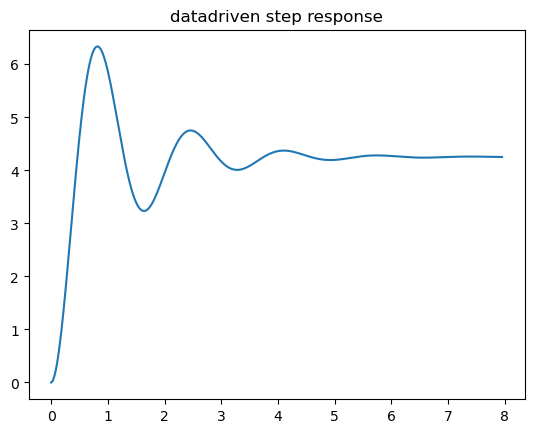

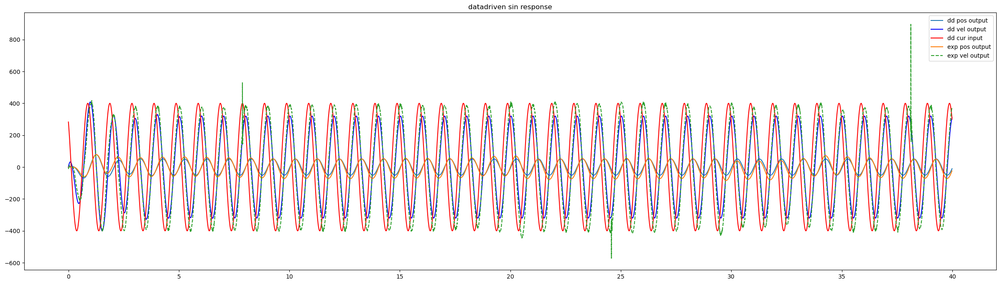

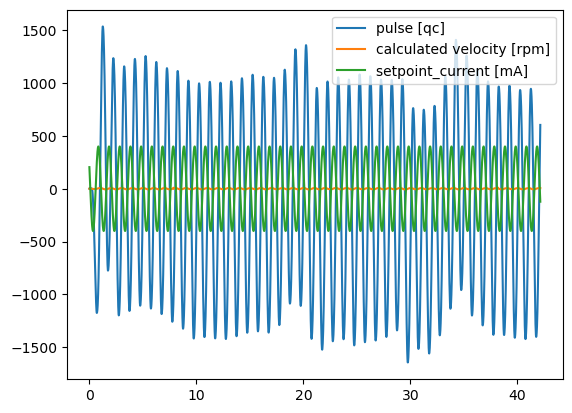

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import control

import scipy
import matplotlib as mpl

plt.rcParams.update(mpl.rcParamsDefault)

def Hankel_matrix(z: np.array, i: int, N: int, t: int) -> np.array:
    '''
    arguments:
    z is a row array (len > 1) where each element is a column array of the same length
    i is a natural number
    N (number of columns) is a natural number >= 1
    t (number of rows) is a natural number >= 1

    precondition:
    i+t+N-2 must be less than len(z)

    return:
    matrix:
    ```
    [[z(i)      z(i+1)    z(i+2)    ...   z(i+N-1)  ]
     [z(i+1)    z(i+2)    z(i+3)    ...   z(i+N)    ]
     [z(i+2)    z(i+3)    z(i+4)    ...   z(i+N+1)  ]
     [               .....                          ]
     [z(i+t-1)  z(i+t)    z(i+t+1)  ...   z(i+t+N-2)]]
    ```
    '''
    if i + t + N - 2 >= z.shape[1]:
        raise Exception(f"source array ({z.shape[1]} elements) can't build Hankel matrix {t}x{N}!")

    sigma = z.shape[0]

    Hz = np.zeros((t*sigma, N))

    for tt in range(t):
        for nn in range(N):
            for s in range(sigma):
                Hz[tt*sigma + s, nn] = z[s, nn + tt]

    return Hz


def Make_data_driven_dynamics(x_0: np.array, x_1: np.array, u_0: np.array) -> np.array:
    i = 0
    #Nt = lambda z: (z.shape[1] - (z.shape[0] - 1), z.shape[0])
    #Nx0, tx0 = Nt(x_0)
    #Nx1, tx1 = Nt(x_1)
    #Nu0, tu0 = Nt(u_0)

    Nx0 = x_0.shape[1]
    Nx1 = x_1.shape[1]
    Nu0 = u_0.shape[1]

    tx0 = tx1 = tu0 = 1
    num_cols = np.min((Nx0, Nx1, Nu0))

    X_0 = Hankel_matrix(x_0, i, num_cols, tx0) # sinal, i, N, t
    X_1 = Hankel_matrix(x_1, i, num_cols, tx1)
    U_0 = Hankel_matrix(u_0, i, num_cols, tu0)

    #plt.figure(figsize=(15,4))
    #plt.plot(x_0[0,:]*360/(3.5*2000),linewidth=1)
    #plt.plot(x_0[1,:]*180/np.pi, '--',linewidth=1)
    #plt.plot(x_1[0,:]*360/(3.5*2000),linewidth=1)
    #plt.plot(x_1[1,:]*180/np.pi, '--',linewidth=1)
    #plt.plot(X[0,:190]*360/(3.5*2000), linewidth=1)
    #plt.plot(X[1,:190]*180/np.pi, linewidth=1)
    #plt.title("xablau")
    #plt.legend(['x_0 0', 'x_0 1', 'x_1 0', 'x_1 1', "exp 0", "exp 1"])
    #plt.show()

    Inverse = np.block([[U_0], [X_0]])
    Inverse = np.linalg.pinv(Inverse)

    dynamics = X_1 @ Inverse

    m = u_0.shape[0]

    A = dynamics[:, m:]
    B = dynamics[:, :m]

    return B, A


def Model_01(x0: np.array, N: int) -> np.array:
    A = np.array([[0.2]])
    B = np.array([[0.5]])

    X = np.zeros((N, 1))
    U = np.zeros((N, 1))
    X[0, 0] = x0[0, 0]
    x = x0

    for i in range(N - 1):
        u = np.array([[np.sin(2 * i)]])
        x = A @ x + B @ u
        X[i + 1, 0] = x[0, 0]
        U[i, 0] = u[0, 0]

    return X, U


def Model_02(x0: np.array, N: int) -> np.array:
    A = np.array([[1, 0.05],
                  [0, 1]])
    B = np.array([[0],
                  [10 / 3]])

    X = np.zeros((N, 2))
    U = np.zeros((N, 1))
    X[0, :] = x0[:, 0]
    x = x0

    for i in range(N - 1):
        u = np.array([[np.sin(2 * i)]])
        x = A @ x + B @ u
        X[i + 1, :] = x[:, 0]
        U[i, 0] = u[0, 0]

    return X, U


def manopla_model(experiment_log) -> np.array:
    import pandas as pd
    df = pd.read_csv(experiment_log)
    # df.rename(str.strip, axis = 'columns')
    n_points, n_columns = df.shape


    time = np.asarray(df["time_us"]).reshape((1, n_points))
    pulse = np.asarray(df["pulse_qc"]).reshape((1, n_points))
    setpoint_current = np.asarray(df["setpoint_current_mA"]).reshape((1, n_points))
    actual_current = np.asarray(df["actual_current_mA"]).reshape((1, n_points))
    epos_velocity = np.asarray(df["epos_velocity_unfiltered_rpm"]).reshape((1, n_points))
    calculated_velocity = np.asarray(df["calculated_velocity_rad/s"]).reshape((1, n_points))

    outputs = np.concatenate((pulse, calculated_velocity), axis=0)
    output_names = ["pulse [qc]", "calculated velocity [rpm]"]
    
    inputs = setpoint_current
    input_names = ["setpoint_current [mA]"]

    return time, outputs, inputs, output_names, input_names


time, X, U, output_names, input_names = manopla_model(
    '/home/grilo/Git/manopla-system-identification-test/KEEPIT-log_2023_09_06-13_17_50-openloop.csv')

time=time/1e6
time=time-time[0][0]
time=np.reshape(time,(len(time[0],)))

x0 = np.array([[0]])
N = 190
#N=4000

plt.figure()
plt.plot(time[:190], X[0,:190], time[:190], X[1,:190], time[:190], U[0,:190])
plt.legend([*output_names, *input_names])
#plt.show(block=False)

x_0 = X[:, 0:N - 1]
x_1 = X[:, 1:N]
u_0 = U[:, 0:N - 1]

B, A = Make_data_driven_dynamics(x_0, x_1, u_0)

print('A Good: ', A)
print('B Good: ', B)

C = np.eye(2)
D = np.array([[0],[0]])

time_dd,output_dd=control.step_response(control.ss(A, B, C, D, 0.01))

x=output_dd[0,0,:]

plt.figure()
plt.plot(time_dd, x)
plt.title('datadriven step response')
#plt.show(block=False)

time_dd = np.arange(0, 40, .01)
input_dd = 400*np.sin(time_dd*2*np.pi-np.pi-np.pi/4)

#time_dd,output_dd=control.forced_response(control.ss(A,B,C,D,0.01), time_dd, X0=[0,0], U=input_dd)
time_dd,output_dd_0=control.forced_response(control.ss(A,B,C,D,0.01), time_dd, X0=[0,0], U=U[0][0:len(time_dd)])

x=output_dd_0[0,:]
xdot=output_dd_0[1,:]

plt.figure(figsize=(30,8))
plt.plot(time_dd[0:len(time_dd)], x[0:len(time_dd)]*360/(3.5*2000), time_dd[0:len(time_dd)], xdot[0:len(time_dd)]*180/np.pi, 'b')
plt.plot(time_dd[0:len(time_dd)], input_dd[0:len(time_dd)], 'r')
plt.plot(time[0:len(time_dd)], X[0][0:len(time_dd)]*360/(3.5*2000), time[0:len(time_dd)], X[1][0:len(time_dd)]*180/np.pi, '--')
plt.legend(['dd pos output', 'dd vel output', 'dd cur input', 'exp pos output', 'exp vel output'])
plt.title('datadriven sin response')
plt.show()
#mag, phase, omega = control.bode_plot(control.ss(A,B,C,D,0.01))

#-------------------------------------------------------------------------------------------------------------------

plt.figure()
plt.plot(time, X[0], time, X[1], time, U[0])
plt.legend([*output_names, *input_names])
plt.show(block=False)


# Exploração da identificação Data Driven

In [11]:

plt.rcParams.update(mpl.rcParamsDefault)
dict_data = {}

C = np.array([[1,0]])
D = np.array([[0]])

time_dd = np.arange(0, 40, .01) # 0 to 40 seconds
dict_data['time_dd'] = time_dd

input_dd = 400 * np.sin(time_dd * 2 * np.pi - np.pi - np.pi / 4)

dict_data['data'] = {}

dict_data['index_max_error'] = 0
dict_data['index_min_error'] = 0

spans = (*[(s,100) for s in np.arange(0,4215-100,100)],     # (0,100)  (100,100)  (200,100)  (300,100) ...
         *[(s,500) for s in np.arange(0,4215-500,100)],     # (0,500)  (100,500)  (200,500)  (300,500) ...
         *[(s,1000) for s in np.arange(0,4215-1000,100)],   # (0,1000) (100,1000) (200,1000) (300,1000) ...
         *[(s,1000) for s in np.arange(0,4215-1000,5)],     # (0,1000) (5,1000)   (10,1000)  (15,1000) ...
            (0,4215))                                       # (0,4215) (tudão!)

print("len spans:", len(spans)) # 757



interp_angle_output = scipy.interpolate.interp1d(time, X[0],kind='cubic')

dict_data['interp_angle_output']=interp_angle_output

interp_current_input = scipy.interpolate.interp1d(time, U[0],kind='cubic')

dict_data['interp_current_input']=interp_current_input

for iter,(start_idx,N) in enumerate(spans):

    #start_idx = 0
    #N = 190
    # N=4000

    data_name=f'{start_idx}_{N}'
    dict_data['data'][iter]={}
    dict_data['data'][iter]['data_name']=data_name
    
    x_0 = X[:, start_idx   :start_idx+N+1-1]
    x_1 = X[:, start_idx+1 :start_idx+N+1]
    u_0 = U[:, start_idx   :start_idx+N+1-1]

    #print(start_idx, N, x_0.shape, x_1.shape, u_0.shape)

    B, A = Make_data_driven_dynamics(x_0, x_1, u_0)

    #print('A Good: ', A)
    #print('B Good: ', B)

    dict_data['data'][iter]['A']=A
    dict_data['data'][iter]['B']=B

    #time_dd, output_dd = control.step_response(control.ss(A, B, C, D, 0.01))

    #x = output_dd[0, 0, :]

    #plt.figure()
    #plt.plot(time_dd, x)
    #plt.title('datadriven step response')
    #plt.show(block=False)

    # time_dd,output_dd=control.forced_response(control.ss(A,B,C,D,0.01), time_dd, X0=[0,0], U=input_dd)
    _, output_dd = control.forced_response(control.ss(A, B, C, D, 0.01), time_dd, X0=[0, 0],
                                                U=interp_current_input(time_dd))
    dict_data['data'][iter]['output'] = output_dd
    
    #plt.figure()
    #plt.plot(time_dd, input_dd, 'r')
    #plt.plot((time[0][0:len(time_dd)] - time[0][0]) / 1e6, X[0][0:len(time_dd)], '--')
    #plt.legend(['dd pos output', 'dd vel output', 'dd cur input', 'exp pos output'])
    #plt.title('datadriven sin response')
    #plt.show(block=False)

    # mag, phase, omega = control.bode_plot(control.ss(A,B,C,D,0.01))
    #mpl.rcParams['figure.figsize'] = (100,100)
    #mpl.rcParams['figure.dpi'] = 300
    #mpl.rcParams.update(mpl.rcParamsDefault)

    #plt.figure()
    #plt.plot(time_dd[0:len(time_dd)],output_dd_0[0,:len(time_dd)],'.', markersize=1)
    #plt.plot(time_dd[0:len(time_dd)],output_dd_1[0,:len(time_dd)],'.', markersize=1)
    #plt.plot(time[0:len(time_dd)], X[0][0:len(time_dd)], '.', markersize=1)
    #plt.legend(['output N=4000', 'output N=190'])
    #plt.show()

    error_vector = np.square(output_dd[:len(time_dd)] - interp_angle_output(time_dd))
    error = np.trapz(error_vector, time_dd)
    dict_data['data'][iter]['error_vector'] = error_vector
    dict_data['data'][iter]['error'] = error


    if error < dict_data['data'][dict_data['index_min_error']]['error']:
        dict_data['index_min_error'] = iter 
    
    if error > dict_data['data'][dict_data['index_max_error']]['error']:
        dict_data['index_max_error'] = iter 

    #print(f'error: {np.trapz(error)}')
    
    #plt.figure()
    #plt.plot(time_dd, error_0, 'r', time_dd, error_1, 'b')
    #plt.legend(['error_0', 'error_1'])
    #plt.show()

print()
print(f"pior span   (maior erro): {dict_data['index_max_error']} ({dict_data['data'][dict_data['index_max_error']]['error']}) ({dict_data['data'][dict_data['index_max_error']]['data_name']})")
print(f"modelo   (maior erro):")
print("A", dict_data['data'][dict_data['index_max_error']]['A'])
print("B", dict_data['data'][dict_data['index_max_error']]['B'])
print()
print(f"melhor span (menor erro): {dict_data['index_min_error']} ({dict_data['data'][dict_data['index_min_error']]['error']}) ({dict_data['data'][dict_data['index_min_error']]['data_name']})")
print(f"modelo   (menor erro):")
print("A", dict_data['data'][dict_data['index_min_error']]['A'])
print("B", dict_data['data'][dict_data['index_min_error']]['B'])



len spans: 757


/tmp/ipykernel_2910522/1035517493.py:92: RuntimeWarning: overflow encountered in square
  error_vector = np.square(output_dd[:len(time_dd)] - interp_angle_output(time_dd))
/home/grilo/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:4978: RuntimeWarning: overflow encountered in add
  ret = (d * (y[tuple(slice1)] + y[tuple(slice2)]) / 2.0).sum(axis)



pior span   (maior erro): 7 (inf) (700_100)
modelo   (maior erro):
A [[1.06956701 4.78399144]
 [0.00667675 0.39287763]]
B [[0.2421226 ]
 [0.02329255]]

melhor span (menor erro): 33 (1703304.9115736939) (3300_100)
modelo   (menor erro):
A [[ 9.98609061e-01  1.09025360e+01]
 [-1.13123668e-04  9.77691957e-01]]
B [[0.0086104 ]
 [0.00080799]]


In [12]:
print("spans:",len(list(dict_data['data'].keys())))


spans: 757


A bad:
 [[1.06956701e+00 4.78399144e+00]
 [6.67675267e-03 3.92877625e-01]]
B bad:
 [[2.42122597e-01]
 [2.32925495e-02]]
output max,min: 8.722687464004378e+188, 0.0
A good:
 [[9.98609061e-01 1.09025360e+01]
 [-1.13123668e-04 9.77691957e-01]]
B good:
 [[8.61040177e-03]
 [8.07991033e-04]]
output max,min: 1670.8133057048015, -1831.8424763792232


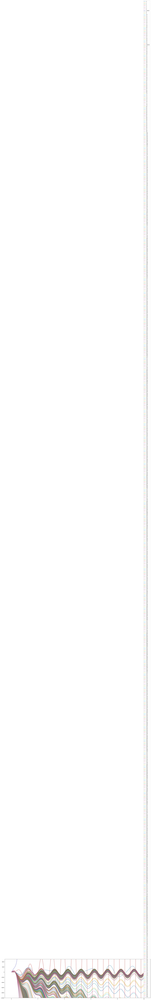

In [65]:
plt.figure(figsize=(30,8))

Z=1000
i=0
legend = []
minimo = '0_100'

for k,v in dict_data['data'].items():
    if k==dict_data['index_min_error']:
        legend.append(f'{k}(min)')
        plt.plot(dict_data['time_dd'][:Z],v['output'][:Z],'r--')
    elif k==dict_data['index_max_error']:
        legend.append(f'{k}(max)')
        plt.plot(dict_data['time_dd'][:Z],v['output'][:Z],'b--')
    else:
        legend.append(k)
        plt.plot(dict_data['time_dd'][:Z],v['output'][:Z])

    i+=1

np.set_printoptions(formatter={'float': '{:.8e}'.format})
print(f"A bad:\n {dict_data['data'][dict_data['index_max_error']]['A']}")
print(f"B bad:\n {dict_data['data'][dict_data['index_max_error']]['B']}")
print(f"output max,min: {np.max(dict_data['data'][dict_data['index_max_error']]['output'])}, {np.min(dict_data['data'][dict_data['index_max_error']]['output'])}")

print(f"A good:\n {dict_data['data'][dict_data['index_min_error']]['A']}")
print(f"B good:\n {dict_data['data'][dict_data['index_min_error']]['B']}")
print(f"output max,min: {np.max(dict_data['data'][dict_data['index_min_error']]['output'])}, {np.min(dict_data['data'][dict_data['index_min_error']]['output'])}")

plt.ylim([-10000,5000])
plt.legend(legend)
plt.show()



spans: 757


/tmp/ipykernel_2910522/3072049102.py:26: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim([0,10e10])


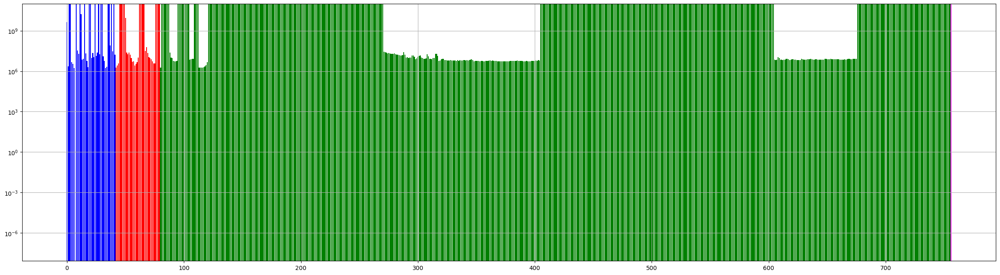

33


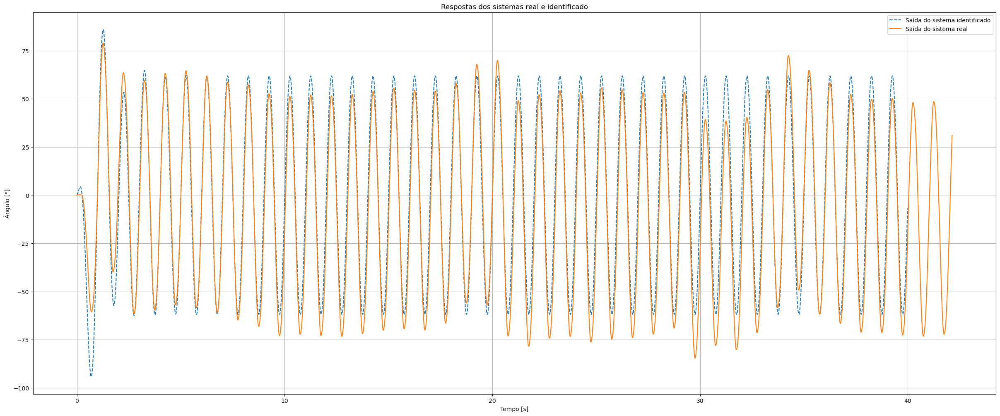

In [14]:
data_max_error = dict_data['index_max_error']
data_min_error = dict_data['index_min_error']

max_error = dict_data['data'][data_max_error]['error']
min_error = dict_data['data'][data_min_error]['error']

print("spans:",len(list(dict_data['data'].keys())))

fig,ax = plt.subplots(figsize=(30,8))
for k, v in dict_data['data'].items():
    #if v['error']<10e50:
    #plt.plot(v['index'], v['error'], '*')
    if v['data_name'].split('_')[1] == '100':
        color = 'blue'
    elif v['data_name'].split('_')[1] == '500':
        color = 'red'
    elif v['data_name'].split('_')[1] == '1000':
        color = 'green'
    else:
        color = 'magenta'
    plt.bar(k, v['error'], color=color)
    
    #plt.annotate(k, (v['index'], v['error']))
ax.set_yscale('log')
plt.grid()
plt.ylim([0,10e10])
plt.show()

#plt.figure(figsize=(30,8))
##plt.plot(time,X[0]/(3.5*2000))
##plt.plot(dict_data['time_dd'],dict_data['data'][data_max_error]['output'])
#plt.plot(dict_data['data']["0_4215"]['output'], '--')
#plt.plot(dict_data['data'][data_min_error]['output'])
#plt.grid()
#plt.show()

print(dict_data["index_min_error"])
fig,ax = plt.subplots(figsize=(30,12))
#plt.plot(time,X[0]/(3.5*2000))
#plt.plot(dict_data['time_dd'],dict_data['data'][data_max_error]['output'])
plt.plot(dict_data['time_dd'], dict_data['data'][data_min_error]['output']*360/(2000*3.5), '--')
plt.plot(time, X[0]*360/(2000*3.5))

plt.grid()
ax.set_title("Respostas dos sistemas real e identificado")
ax.set_xlabel("Tempo [s]")
ax.set_ylabel("Ângulo [°]")
plt.legend(["Saída do sistema identificado", "Saída do sistema real"])
#plt.rcParams.update({'font.size': 40})
plt.rcParams.update(mpl.rcParamsDefault)
#plt.xlim([20,22])
plt.show()

In [60]:
plt.figure(figsize=(80,30), dpi=300)
plt.plot(time, X[0],'o-', linewidth=1, markersize=1)
plt.plot(dict_data['time_dd'], dict_data['interp_angle_output'](dict_data['time_dd']),'o-', linewidth=1, markersize=1)
plt.legend(['original position', 'interpolated position'], loc='upper left')
plt.show()

plt.figure(figsize=(80,30), dpi=300)
plt.plot(time[:-1], X[1][:-1],'o-', linewidth=1, markersize=1)
plt.plot(dict_data['time_dd'], np.gradient(dict_data['interp_angle_output'](dict_data['time_dd']), dict_data['time_dd'])*(2*np.pi/(2000*3.5)),'o-', linewidth=1, markersize=1)
plt.legend(['original velocity', 'interpolated velocity'], loc='upper left')
plt.show()